In [1]:
# High-Resolution Multi-Path Image Colorization using TensorFlow Datasets (Imagenette)

# Step 1: Imports
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv2D, UpSampling2D, Flatten, Dense,
                                     Concatenate, RepeatVector, Reshape)
from tensorflow.keras import backend as K
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
from tqdm.keras import TqdmCallback
from tqdm import tqdm
import cv2
import tensorflow as tf


In [2]:
# Step 2: Load and preprocess images from TensorFlow Datasets (Imagenette)
def preprocess_dataset(dataset, limit=5000, img_size=(128, 128)):
    X_l, Y_ab, originals = [], [], []
    for i, example in enumerate(tfds.as_numpy(dataset)):
        if i >= limit:
            break
        try:
            img = example['image'] / 255.0
            img_resized = resize(img, img_size, anti_aliasing=True)
            lab = rgb2lab(img_resized)
            lab[:, :, 0] /= 100.0
            lab[:, :, 1:] /= 128.0
            X_l.append(lab[:, :, 0])
            Y_ab.append(lab[:, :, 1:])
            originals.append(img_resized)
        except:
            continue
    return np.array(X_l)[..., np.newaxis], np.array(Y_ab), np.array(originals)


In [3]:
# Load Imagenette dataset
train_ds = tfds.load("imagenette/160px", split="train", shuffle_files=True)
X_train, Y_train, original_images = preprocess_dataset(train_ds, limit=5000)


In [4]:
# Step 3: Define Model for 128x128 Input
input_L = Input(shape=(128, 128, 1))

x = Conv2D(64, (3, 3), strides=1, padding='same', activation='relu')(input_L)
x = Conv2D(128, (3, 3), strides=2, padding='same', activation='relu')(x)  # 64x64
x = Conv2D(128, (3, 3), strides=1, padding='same', activation='relu')(x)
x = Conv2D(256, (3, 3), strides=2, padding='same', activation='relu')(x)  # 32x32
mid_level = x

g = Conv2D(512, (3, 3), strides=2, padding='same', activation='relu')(x)  # 16x16
g = Conv2D(512, (3, 3), strides=2, padding='same', activation='relu')(g)  # 8x8
g = Flatten()(g)
g = Dense(1024, activation='relu')(g)
g = Dense(512, activation='relu')(g)

g_repeated = RepeatVector(32 * 32)(g)
g_reshaped = Reshape((32, 32, 512))(g_repeated)
fused = Concatenate(axis=-1)([mid_level, g_reshaped])

x = Conv2D(256, (3, 3), padding='same', activation='relu')(fused)
x = UpSampling2D((2, 2))(x)  # 64x64
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)  # 128x128
output_ab = Conv2D(2, (3, 3), activation='tanh', padding='same')(x)

model = Model(inputs=input_L, outputs=output_ab)
model.compile(optimizer='adam', loss='mse')

In [5]:
# Step 4: Train the model with TQDM progress bar
model.fit(X_train, Y_train, batch_size=16, epochs=40, validation_split=0.1, callbacks=[TqdmCallback(verbose=1)])


0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 67s 167ms/step - loss: 0.0213 - val_loss: 0.0135
Epoch 2/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 50s 111ms/step - loss: 0.0138 - val_loss: 0.0135
Epoch 3/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 41s 111ms/step - loss: 0.0134 - val_loss: 0.0135
Epoch 4/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 41s 111ms/step - loss: 0.0131 - val_loss: 0.0131
Epoch 5/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0127 - val_loss: 0.0133
Epoch 6/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.0123 - val_loss: 0.0134
Epoch 7/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 41s 111ms/step - loss: 0.0125 - val_loss: 0.0127
Epoch 8/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 41s 111ms/step - loss: 0.0123 - val_loss: 0.0119
Epoch 9/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 31s 111ms/step - loss: 0.0120 - val_loss: 0.0121
Epoch 10/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 41s 111ms/step - loss: 0.0118 - val_loss: 0.0121
Epoch 11/40
282/282 ━━━━━━━━━━━━━━━━━━━━ 41s 110ms/step - loss: 0.0125 - val_loss: 0.0123
Epoch 12/40
282/282

In [6]:
# Step 5: Grad-CAM + Visualization

def compute_gradcam(img_input):
    grad_model = Model(inputs=model.input, outputs=[mid_level, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.array([img_input]))
        loss = K.mean(predictions)
    grads = tape.gradient(loss, conv_outputs)[0]
    conv_outputs = conv_outputs[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.zeros(conv_outputs.shape[0:2], dtype=np.float32)
    for i, w in enumerate(weights):
        cam += w * conv_outputs[:, :, i]
    cam = np.maximum(cam, 0)
    cam = cam / np.max(cam) if np.max(cam) != 0 else cam
    cam = cv2.resize(cam, (128, 128))
    return cam


In [7]:
# Visualization function
def predict_and_display(index):
    L = X_train[index]
    ab = model.predict(L[np.newaxis, ...])[0] * 128.0
    L_vis = L[:, :, 0] * 100.0
    lab_img = np.zeros((128, 128, 3))
    lab_img[:, :, 0] = L_vis
    lab_img[:, :, 1:] = ab
    rgb = lab2rgb(lab_img)

    cam = compute_gradcam(L)
    original = original_images[index]

    fig, axs = plt.subplots(1, 4, figsize=(14, 4))
    axs[0].imshow(original)
    axs[0].set_title("Original")
    axs[0].axis('off')
    axs[1].imshow(L_vis, cmap='gray')
    axs[1].set_title("Grayscale")
    axs[1].axis('off')
    axs[2].imshow(rgb)
    axs[2].set_title("Colorized")
    axs[2].axis('off')
    axs[3].imshow(L_vis, cmap='gray')
    axs[3].imshow(cam, cmap='jet', alpha=0.5)
    axs[3].set_title("Grad-CAM")
    axs[3].axis('off')
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


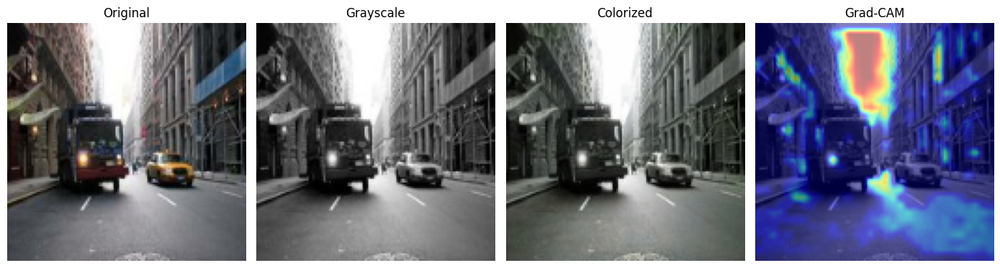

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


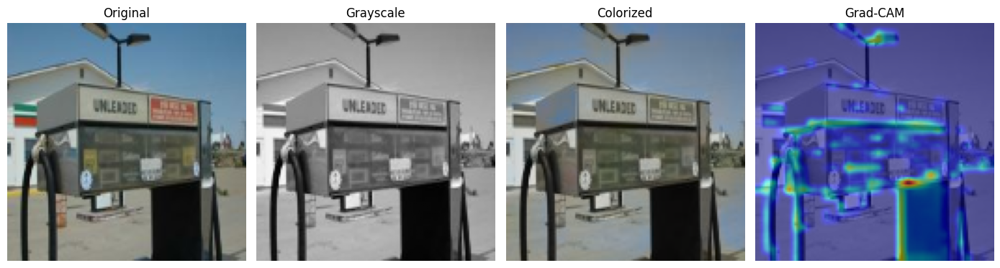

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


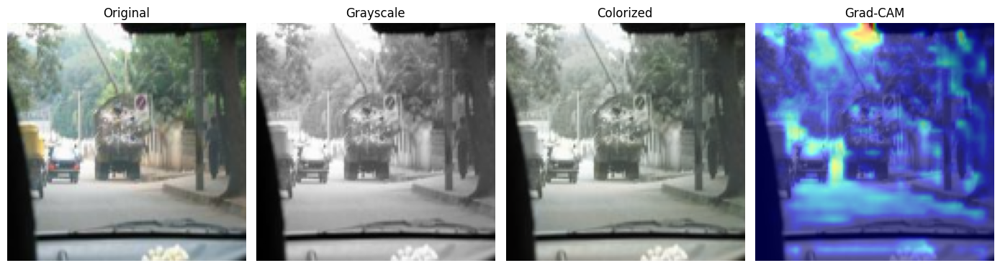

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


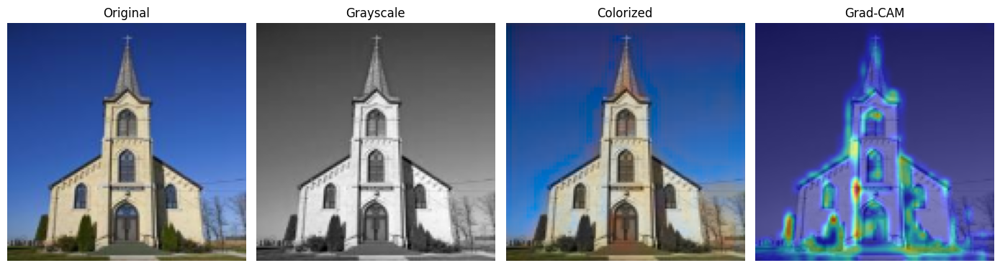

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


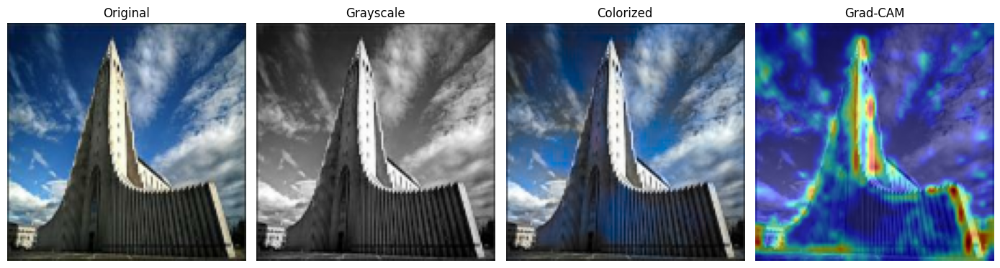

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


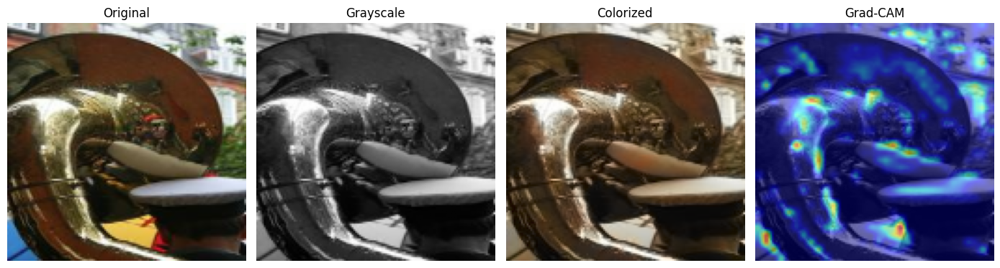

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


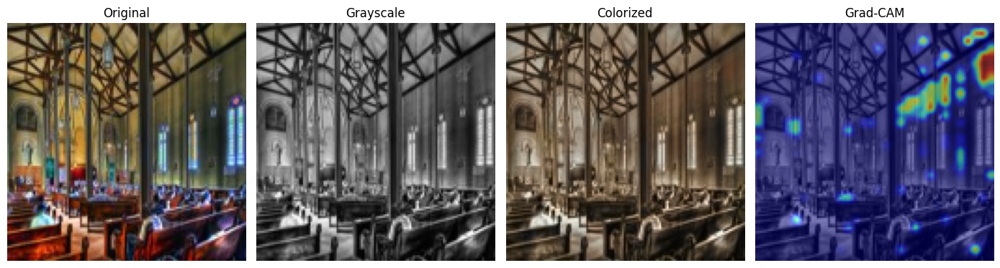

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


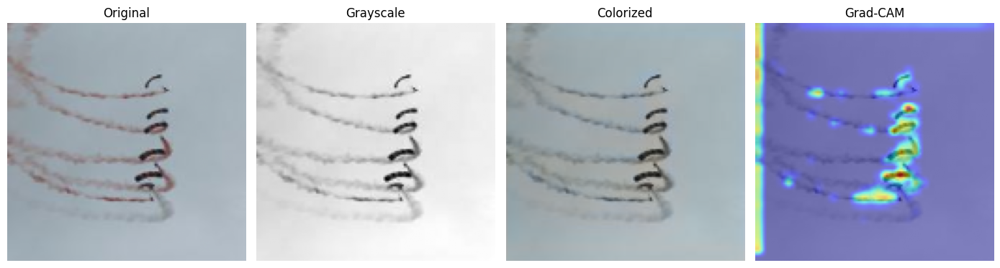

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


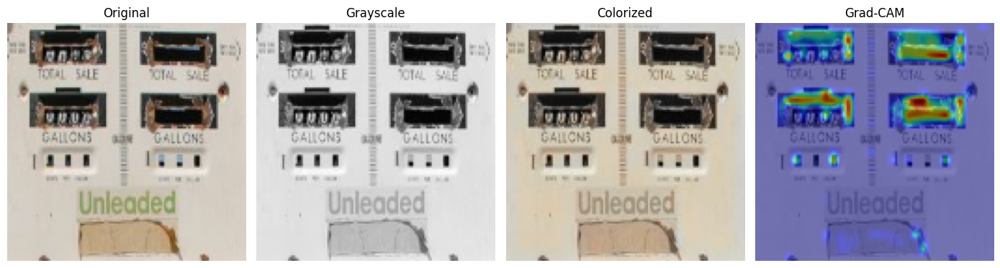

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


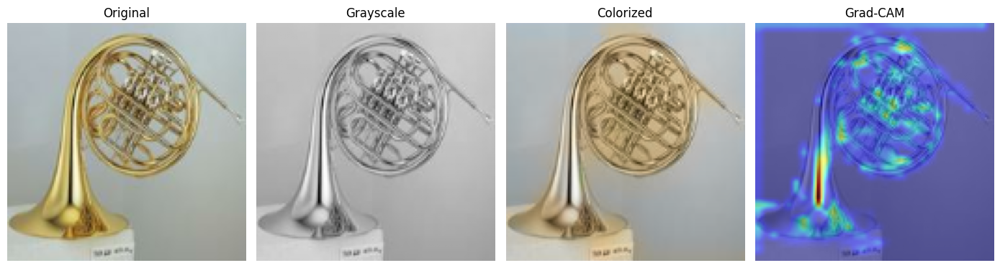

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


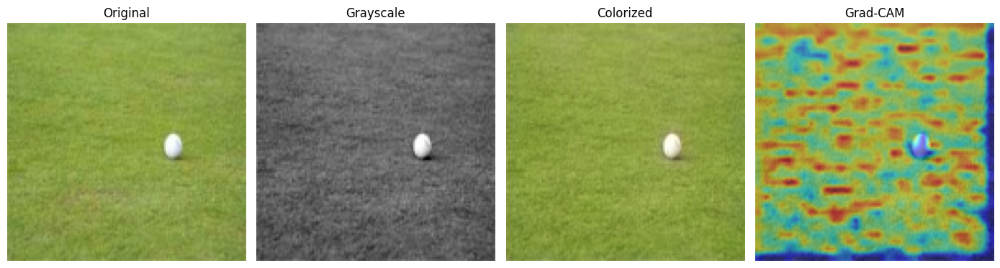

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


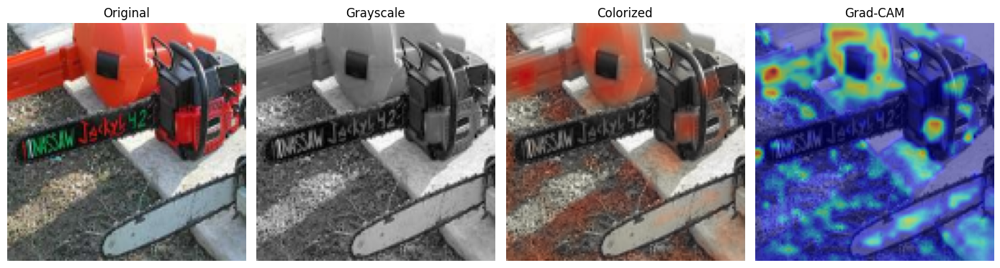

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


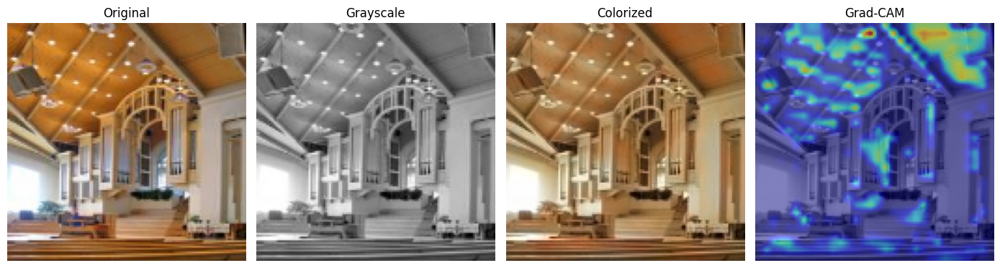

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


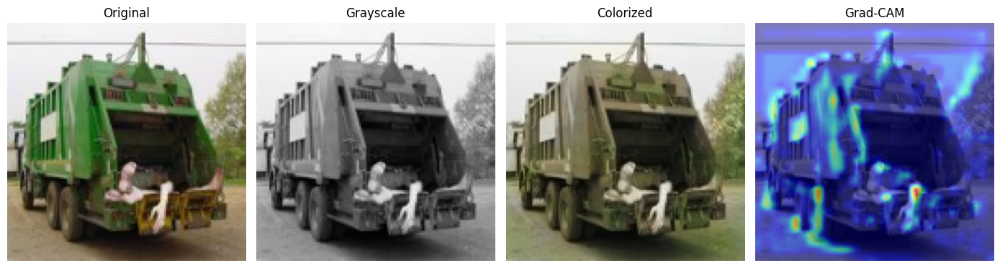

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


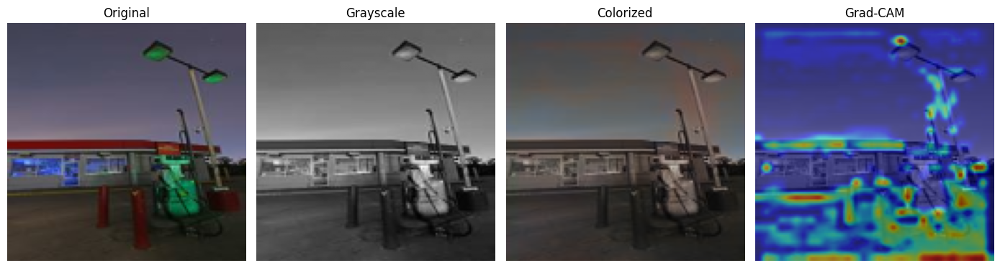

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


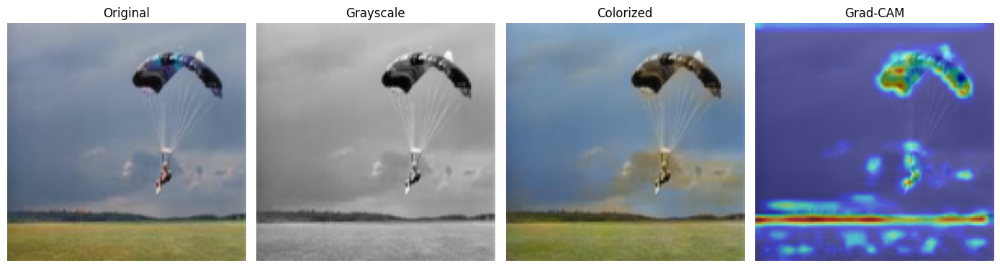

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


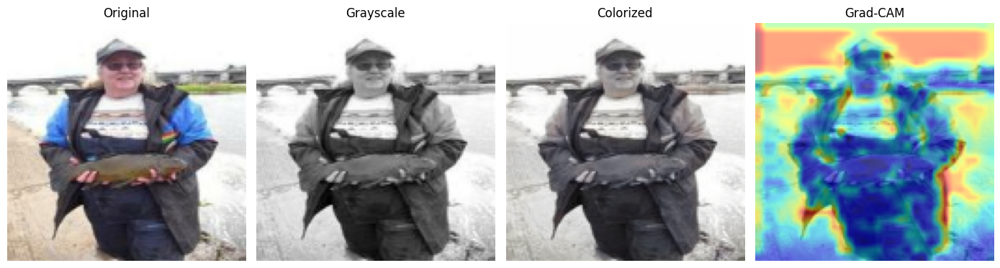

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


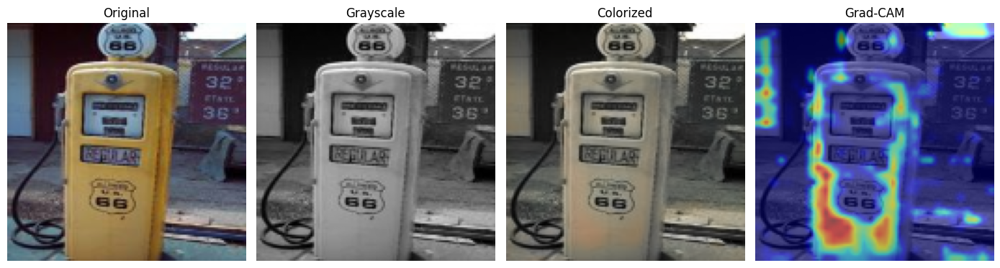

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


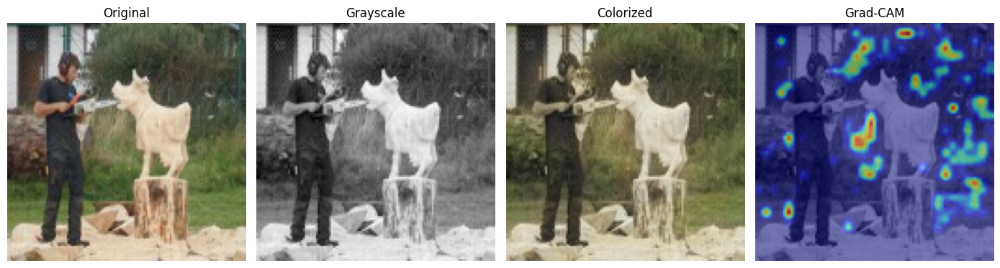

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


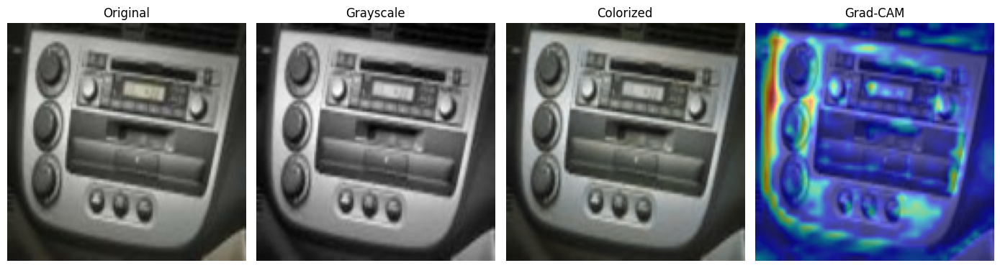

In [ ]:
# Example prediction
for i in range(100,120):
  predict_and_display(i)

In [ ]:
!pip install lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from sklearn.metrics import mean_squared_error
import numpy as np
import tensorflow as tf
import lpips  # LPIPS uses PyTorch
import torch
import torchvision.transforms as transforms
from skimage.color import lab2rgb

# Initialize LPIPS model
lpips_fn = lpips.LPIPS(net='alex')  # or use 'vgg'

def evaluate_metrics(dataset='test', num_samples=100):
    total_psnr = 0
    total_ssim = 0
    total_mse = 0
    total_lpips = 0
    count = 0

    if dataset == 'test':
        L_set, ab_set, originals = X_test, Y_test, original_test_images
    else:
        L_set, ab_set, originals = X_train, Y_train, original_images

    for i in range(min(num_samples, len(L_set))):
        L = L_set[i]
        true_ab = ab_set[i]
        original = originals[i]

        # Predict ab and generate color image
        pred_ab = model.predict(L[np.newaxis, ...], verbose=0)[0]
        lab = np.zeros((128, 128, 3))
        lab[:, :, 0] = L[:, :, 0] * 100.0
        lab[:, :, 1:] = pred_ab * 128.0
        pred_rgb = lab2rgb(lab)

        true_lab = np.zeros((128, 128, 3))
        true_lab[:, :, 0] = L[:, :, 0] * 100.0
        true_lab[:, :, 1:] = true_ab * 128.0
        true_rgb = lab2rgb(true_lab)

        # Compute PSNR, SSIM, MSE
        total_psnr += peak_signal_noise_ratio(true_rgb, pred_rgb, data_range=1.0)
        total_ssim += structural_similarity(true_rgb, pred_rgb, win_size=7, channel_axis=-1, data_range=1.0)
        total_mse += mean_squared_error(true_rgb.flatten(), pred_rgb.flatten())

        # Convert to tensors for LPIPS (channels-first, normalized to [-1, 1])
        pred_tensor = torch.tensor(pred_rgb).permute(2, 0, 1).unsqueeze(0).float() * 2 - 1
        true_tensor = torch.tensor(true_rgb).permute(2, 0, 1).unsqueeze(0).float() * 2 - 1

        with torch.no_grad():
            lpips_val = lpips_fn(pred_tensor, true_tensor).item()
        total_lpips += lpips_val

        count += 1

    print(f"Average PSNR: {total_psnr / count:.2f}")
    print(f"Average SSIM: {total_ssim / count:.4f}")
    print(f"Average MSE : {total_mse / count:.6f}")
    print(f"Average LPIPS: {total_lpips / count:.4f}")


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 146MB/s]


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth


In [ ]:
evaluate_metrics(dataset='train', num_samples=100)